In [105]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

pd.set_option('display.max_rows', None)

In [106]:
data = pd.read_csv('data/fifa_players.csv', low_memory=False)

In [107]:
print('Total filas original', len(data))

# filtramos por la fecha de la muestra
data = data[ data['date'] == '2024-07-08' ]

print('Total filtrado', len(data))

Total filas original 353198
Total filtrado 18726


In [108]:
# eliminamos duplicados
data.drop_duplicates(inplace=True)
print('Total duplicados eliminados', len(data))

Total duplicados eliminados 18702


In [109]:
# contamos la cantidad de columns
print('Cantidad de columnas', len(data.columns))

Cantidad de columnas 82


In [110]:
# eliminamos las columnas que no son de interes
data = data.drop(columns=[
    'ID', 'date_id', 'player_name', 'name', 'Growth', 'Joined', 'Loan date end', 
    'date', 'International reputation',
    'Real face',
    'club_name', 'Wage', 'Release clause', 'start_year', 'end_year',
    'Value', 'Wage'
])

In [111]:
# delete empty columns
data = data.drop(columns=['Traits'])

In [112]:
# eliminados datos duplicados
data = data.drop(columns=['PlayStyles', 'PlayStyles +', 'Number of playstyles', 'Attacking work rate', 'Defensive work rate'])

In [113]:
# corregimos la suma de 'Total mentality' deberia sumar 'Composure'
data['Total mentality'] = data['Total mentality'].astype(int) + data['Composure'].astype(int)

In [114]:
# eliminados los atributos dependientes
data = data.drop(columns=['Crossing', 'Finishing', 'Heading accuracy', 'Short passing', 'Volleys'])
data = data.drop(columns=['Dribbling', 'Curve', 'FK Accuracy', 'Long passing', 'Ball control'])
data = data.drop(columns=['Acceleration', 'Sprint speed', 'Agility', 'Reactions', 'Balance'])
data = data.drop(columns=['Shot power', 'Jumping', 'Stamina', 'Strength', 'Long shots'])
data = data.drop(columns=['Aggression', 'Interceptions', 'Att. Position', 'Vision', 'Penalties', 'Composure'])
data = data.drop(columns=['Defensive awareness', 'Standing tackle', 'Sliding tackle'])
data = data.drop(columns=['GK Diving', 'GK Handling', 'GK Kicking', 'GK Positioning', 'GK Reflexes'])

In [115]:
# aliminamos totalizadores
data = data.drop(columns=['Total stats', 'Base stats'])

In [116]:
print('Cantidad final de columnas', len(data.columns))
print(data.columns)

Cantidad final de columnas 24
Index(['Age', 'Overall rating', 'Potential', 'Height', 'Weight', 'foot',
       'Best overall', 'Best position', 'Total attacking', 'Total skill',
       'Total movement', 'Total power', 'Total mentality', 'Total defending',
       'Total goalkeeping', 'Weak foot', 'Skill moves', 'Body type',
       'Pace / Diving', 'Shooting / Handling', 'Passing / Kicking',
       'Dribbling / Reflexes', 'Defending / Pace', 'Physical / Positioning'],
      dtype='object')


In [117]:
# definimos una funcion para evaluar sumas y restas
def evaluar_suma_resta(valor):
    try:
        return eval(valor)
    except:
        return valor

In [118]:
data['Potential'] = data['Potential'].apply(str)

In [119]:
# corregimos los valores de 'Potential', ejem: ##-#
data['Potential'] = data['Potential'].apply(evaluar_suma_resta)
data['Potential'] = data['Potential'].astype(int)

In [120]:
data['left_foot'] = np.where(data['foot'] == 'Left', 1, 0)
data['right_foot'] = np.where(data['foot'] == 'Right', 1, 0)
data = data.drop(columns=['foot'])

In [121]:
data['Best position'] = data['Best position'].str.replace('/players?pn=', '')

In [125]:
data['Body Unique'] = np.where(data['Body type'] == 'Unique', 1, 0)
data['Body Lean 170-'] = np.where(data['Body type'] == 'Lean (170-)', 1, 0)
data['Body Lean 185+'] = np.where(data['Body type'] == 'Lean (185+)', 1, 0)
data['Body Normal 170-'] = np.where(data['Body type'] == 'Normal (170-)', 1, 0)
data['Body Normal 170-185'] = np.where(data['Body type'] == 'Normal (170-185)', 1, 0)
data['Body Normal 185+'] = np.where(data['Body type'] == 'Normal (185+)', 1, 0)
data['Body Stocky 170-'] = np.where(data['Body type'] == 'Stocky (170-)', 1, 0)
data['Body Stocky 170-185'] = np.where(data['Body type'] == 'Stocky (170-185)', 1, 0)
data['Body Stocky 185+'] = np.where(data['Body type'] == 'Stocky (185+)', 1, 0)
data = data.drop(columns=['Body type'])

In [135]:
print(data)

        Age Overall rating  Potential  Height  Weight  Best overall  \
278749   22             91         94     195      94            93   
278750   24             91         94     182      75            93   
278751   32             91         91     181      75            91   
278752   27             90         92     191      82            90   
278753   29             90         90     188      85            90   
278754   31             90         90     200      96            90   
278755   34             90         90     185      81            90   
278756   36             90         90     169      67            91   
278757   26             89         90     187      82            89   
278758   22             89         94     176      73            90   
278759   30             89         89     193      91            89   
278760   31             89         89     175      72            89   
278761   31             89         89     193      92            89   
278762

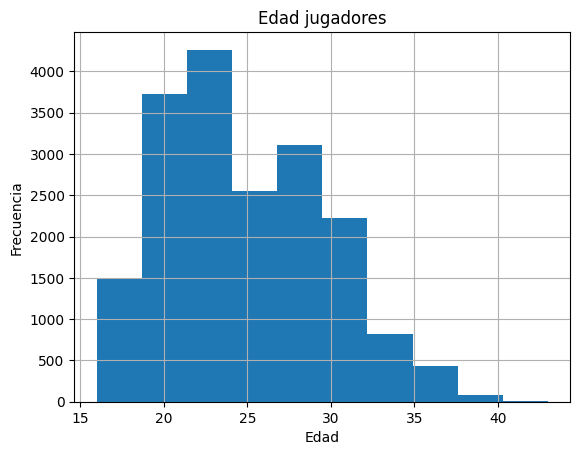

In [143]:
data['Age'].hist()
plt.title('Edad jugadores')
plt.xlabel('Edad')
plt.ylabel('Frecuencia')
plt.show()

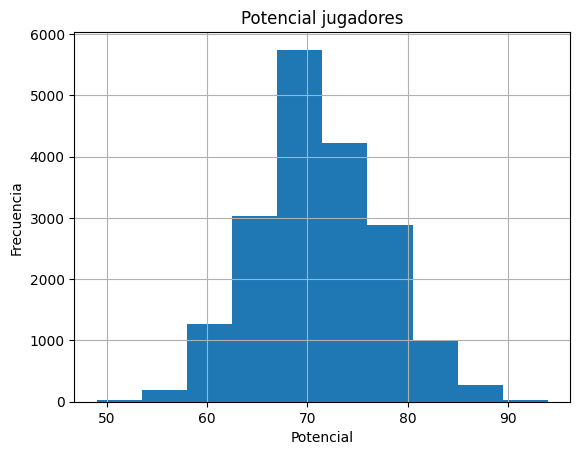

In [144]:
data['Potential'].hist()
plt.title('Potencial jugadores')
plt.xlabel('Potencial')
plt.ylabel('Frecuencia')
plt.show()

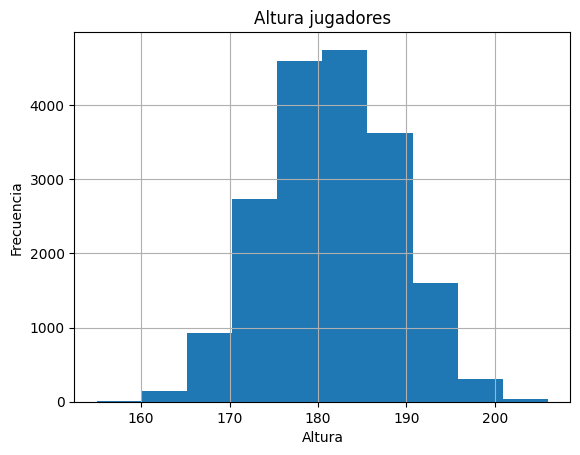

In [145]:
data['Height'].hist()
plt.title('Altura jugadores')
plt.xlabel('Altura')
plt.ylabel('Frecuencia')
plt.show()

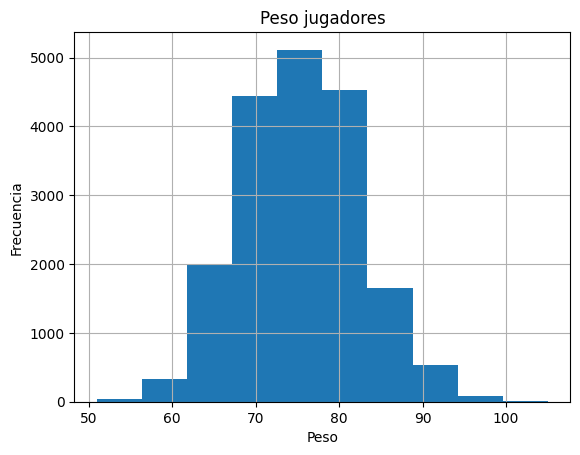

In [146]:
data['Weight'].hist()
plt.title('Peso jugadores')
plt.xlabel('Peso')
plt.ylabel('Frecuencia')
plt.show()

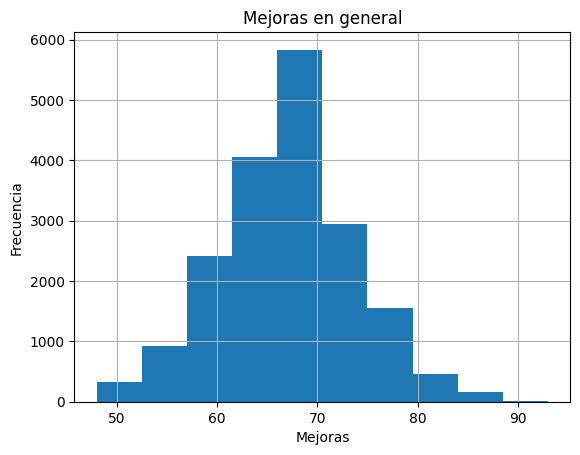

In [147]:
data['Best overall'].hist()
plt.title('Mejoras en general')
plt.xlabel('Mejoras')
plt.ylabel('Frecuencia')
plt.show()

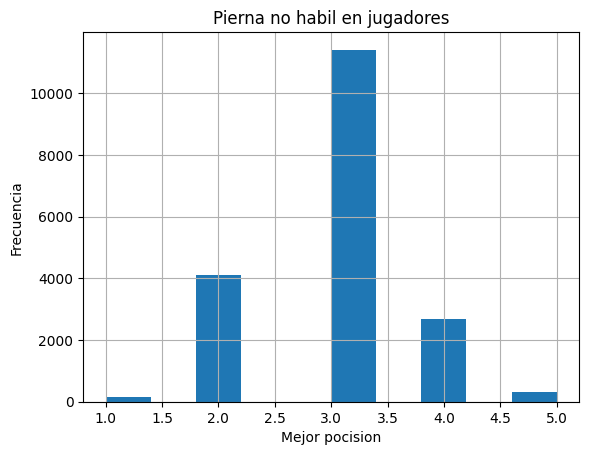

In [149]:
data['Weak foot'].hist()
plt.title('Manejo de pierna no habil en jugadores 1-5')
plt.xlabel('Manejo de pierna no habil')
plt.ylabel('Frecuencia')
plt.show()

In [140]:
# PCA
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaled_data = scaler.fit_transform(data)

# 4. Apply PCA
pca = PCA(n_components=16)  # Reduce to 2 dimensions
principal_components = pca.fit_transform(scaled_data)

# 5. Create a new DataFrame for the results
pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8', 'PC9', 'PC10', 'PC11', 'PC12', 'PC13', 'PC14', 'PC15', 'PC16'])

# 6. Explained variance
explained_variance = pca.explained_variance_ratio_
print("Explained Variance Ratio:", explained_variance)

# 7. Add the PCA results back to the original dataset
df_pca = pd.concat([data, pca_df], axis=1)
print(df_pca)

Explained Variance Ratio: [0.26049609 0.12805578 0.10387884 0.06330492 0.05445945 0.04553052
 0.03722991 0.03466812 0.03140783 0.03120337 0.03090226 0.03052167
 0.02914998 0.02436978 0.02294185 0.01721788]
         Age Overall rating  Potential  Height  Weight  Best overall  \
278749  22.0             91       94.0   195.0    94.0          93.0   
278750  24.0             91       94.0   182.0    75.0          93.0   
278751  32.0             91       91.0   181.0    75.0          91.0   
278752  27.0             90       92.0   191.0    82.0          90.0   
278753  29.0             90       90.0   188.0    85.0          90.0   
278754  31.0             90       90.0   200.0    96.0          90.0   
278755  34.0             90       90.0   185.0    81.0          90.0   
278756  36.0             90       90.0   169.0    67.0          91.0   
278757  26.0             89       90.0   187.0    82.0          89.0   
278758  22.0             89       94.0   176.0    73.0          90.0   
27

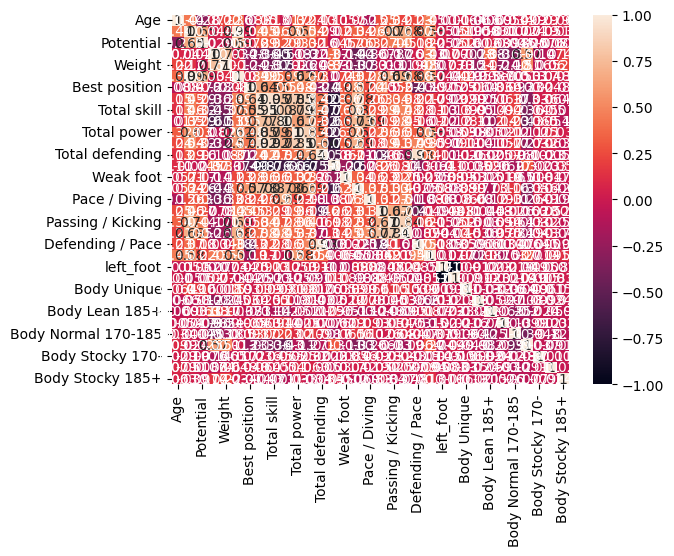

In [133]:
# generamos matriz de correlaciones
import seaborn as sns

correlation_matrix = data.corr()
#print(correlation_matrix)

sns.heatmap(correlation_matrix, annot=True)
plt.show()

#plt.matshow(data.corr(), annot=True)
#plt.show()